# EDA and Data Visualization of Stocks Data

### 1. Import Libraries

In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller
import warnings
from static_plots_functions import *                      #import all functions from the plots_functions.py file
from interactive_plots_func import *               #import all functions from the interactive_plots_func.py file
from combine_static_plots_func import *           #import all functions from the combine_static_plots_func.py file
from combine_interactive_plots_func import *    #import all functions from the combine_interactive_plots_func.py file
warnings.filterwarnings('ignore')
%matplotlib inline

### 2. Load Dataset

In [2]:
df_amazon = pd.read_csv('preprocessed_data/Amazon Data Cleaned.csv')
df_apple = pd.read_csv('preprocessed_data/Apple Data Cleaned.csv')
df_google = pd.read_csv('preprocessed_data/Google Data Cleaned.csv')
df_meta = pd.read_csv('preprocessed_data/Meta Data Cleaned.csv')
df_micro = pd.read_csv('preprocessed_data/Microsoft Data Cleaned.csv')
df_netflix = pd.read_csv('preprocessed_data/Netflix Data Cleaned.csv')
df_nvidia = pd.read_csv('preprocessed_data/Nvidia Data Cleaned.csv')

In [3]:
df_amazon['Date'] = pd.to_datetime(df_amazon['Date'])
df_apple['Date'] = pd.to_datetime(df_apple['Date'])
df_google['Date'] = pd.to_datetime(df_google['Date'])
df_meta['Date'] = pd.to_datetime(df_meta['Date'])
df_micro['Date'] = pd.to_datetime(df_micro['Date'])
df_netflix['Date'] = pd.to_datetime(df_netflix['Date'])
df_nvidia['Date'] = pd.to_datetime(df_nvidia['Date'])

### 3. Exploratory Data Analysis

#### 3.1 Amazon Stocks Dataset EDA

In [4]:
# Amazon Stocks Dataset
df_amazon.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,237.07,26091720,239.015,240.39,236.15,0.004545,237.070000,26.915946,0.000000,0.000000
1,2025-01-28,238.15,41587190,234.290,241.77,233.98,0.004545,237.266364,26.915946,0.086154,0.017231
2,2025-01-27,235.42,49428330,226.210,235.61,225.86,-0.011530,236.930661,26.915946,-0.065106,0.000763
3,2025-01-24,234.85,25890740,234.500,236.40,232.93,-0.002424,236.552359,26.915946,-0.228343,-0.045058
4,2025-01-23,235.42,26404360,234.100,235.52,231.51,0.002424,236.346476,26.915946,-0.308163,-0.097679


In [5]:
# Amazon stocks dataset information
df_amazon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [6]:
# Amazon stocks dataset statistics
df_amazon.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,102.785474,7.562052e+07,102.807976,103.972258,101.537910,-0.001029,103.176778,44.597704,-0.607331,-0.607103
min,2015-01-30 00:00:00,17.726500,1.500750e+07,17.316000,17.975000,17.037000,-0.132178,18.374657,6.021593,-7.175412,-6.336608
25%,2017-07-29 12:00:00,48.955750,5.016876e+07,49.011250,49.299000,48.569500,-0.011248,49.131365,33.087394,-1.826869,-1.701614
50%,2020-01-29 00:00:00,95.068500,6.511360e+07,95.190000,96.122500,94.093500,-0.001162,95.324222,43.818809,-0.635952,-0.605128
75%,2022-07-27 12:00:00,154.849750,8.943181e+07,155.055450,156.993650,153.120000,0.008612,155.267832,55.826887,0.218207,0.220569
max,2025-01-29 00:00:00,238.150000,4.769344e+08,239.015000,241.770000,236.150000,0.151398,237.266364,88.564676,10.762406,10.070825
std,NaN,54.691585,4.042880e+07,54.713597,55.334228,54.036957,0.020393,54.750671,16.139653,2.394952,2.237372


In [7]:
# Correlation between Amazon stocks dataset features
df_amazon.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.888292,-0.259339,0.887850,0.889086,0.887096,0.018747,0.890115,0.121239,-0.095161,-0.100538
Close,0.888292,1.000000,-0.218417,0.999424,0.999736,0.999746,0.036652,0.998263,0.172276,0.009692,0.007685
Volume,-0.259339,-0.218417,1.000000,-0.217203,-0.211782,-0.224656,0.012059,-0.219933,0.026242,0.021243,0.014547
Open,0.887850,0.999424,-0.217203,1.000000,0.999765,0.999720,0.036841,0.997760,0.171322,0.008964,0.007423
High,0.889086,0.999736,-0.211782,0.999765,1.000000,0.999670,0.036218,0.998044,0.172433,0.009890,0.008174
Low,0.887096,0.999746,-0.224656,0.999720,0.999670,1.000000,0.035747,0.998086,0.171065,0.009115,0.007360
Log_Returns,0.018747,0.036652,0.012059,0.036841,0.036218,0.035747,1.000000,0.005942,0.238830,0.044021,-0.006691
EMA_10,0.890115,0.998263,-0.219933,0.997760,0.998044,0.998086,0.005942,1.000000,0.135357,-0.020287,-0.008881
RSI,0.121239,0.172276,0.026242,0.171322,0.172433,0.171065,0.238830,0.135357,1.000000,0.614767,0.443895
MACD,-0.095161,0.009692,0.021243,0.008964,0.009890,0.009115,0.044021,-0.020287,0.614767,1.000000,0.947808


In [8]:
# Checking stationarity of Log Returns
result = adfuller(df_amazon['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -51.02796452052501
p-value: 0.0
The Log Returns series is stationary.


#### Static Visualization

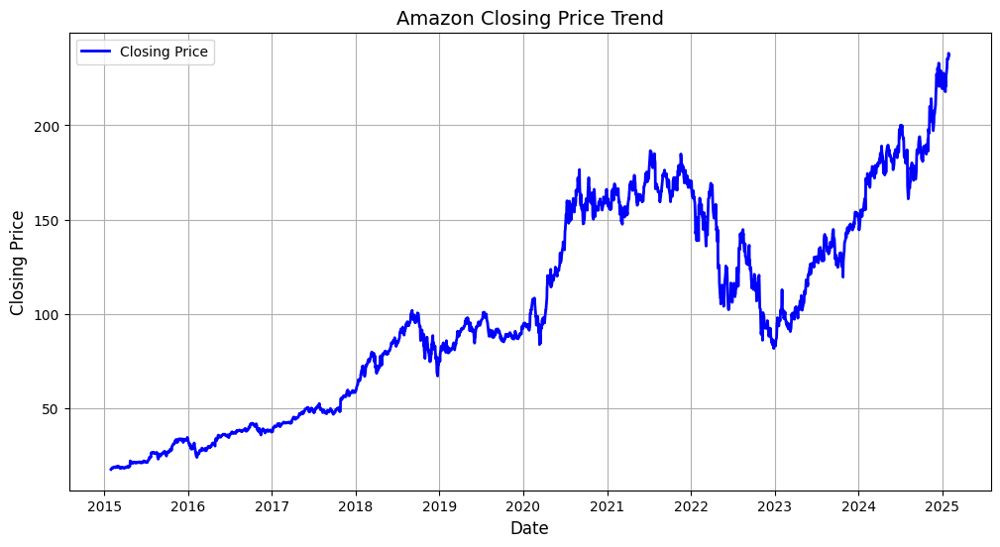

In [9]:
# Closing Price Line Plot
plot_closing_price(df_amazon, 'Amazon')

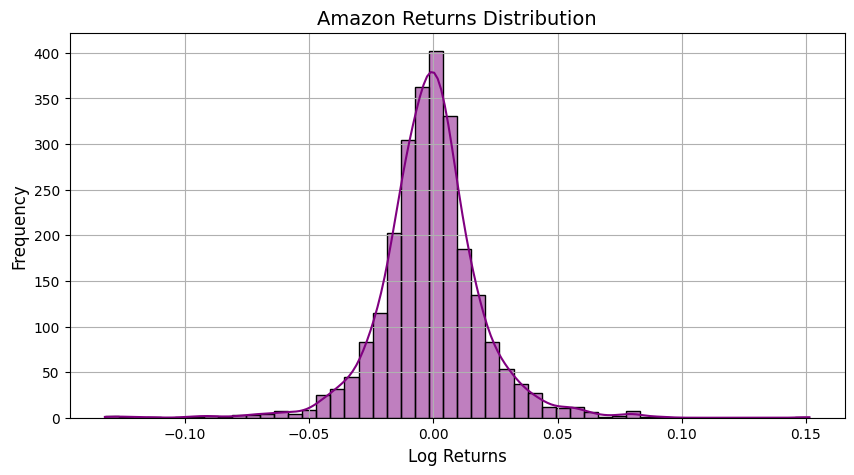

In [10]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_amazon, 'Amazon')

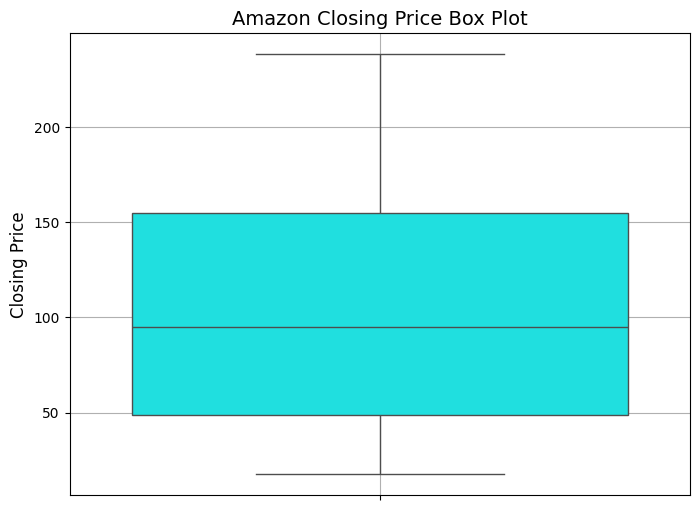

In [11]:
# Box plot of Closing Prices
plot_boxplot_closing(df_amazon, 'Amazon')

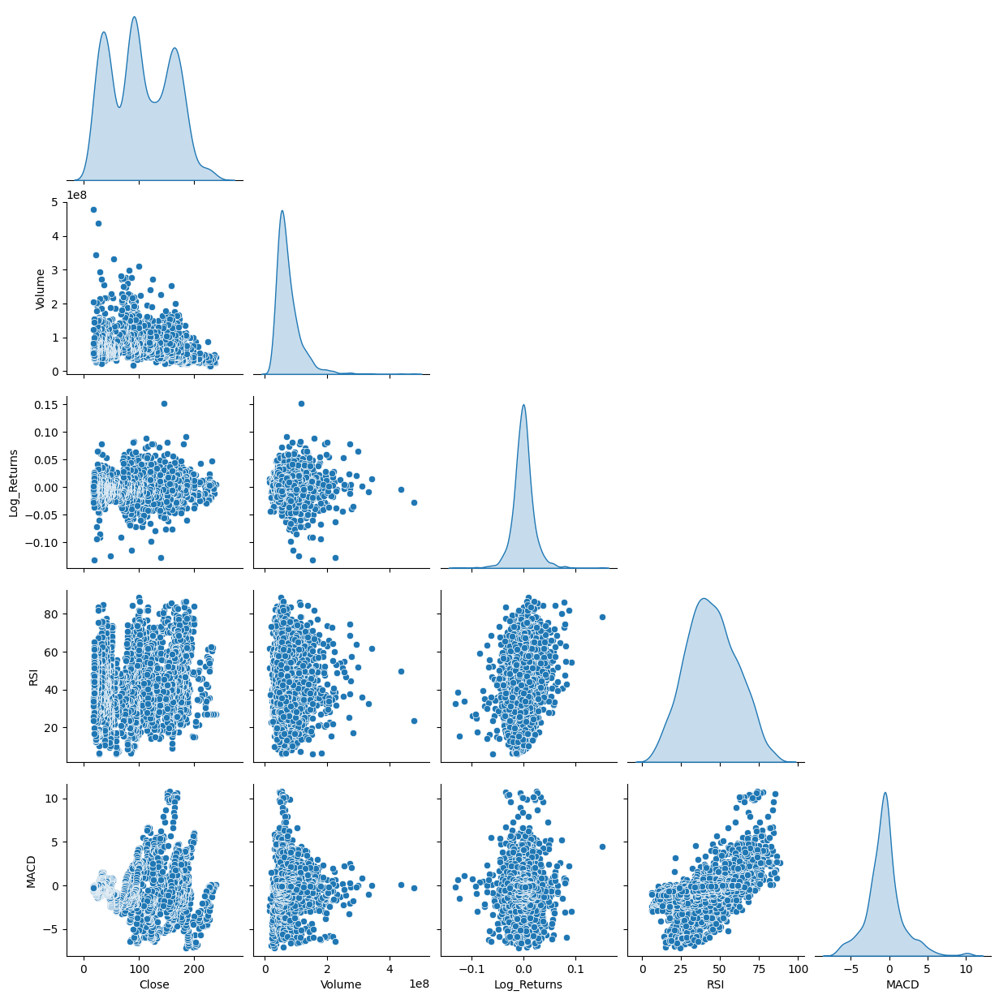

In [12]:
# Pairplot for features relationships
plot_pairplot(df_amazon)

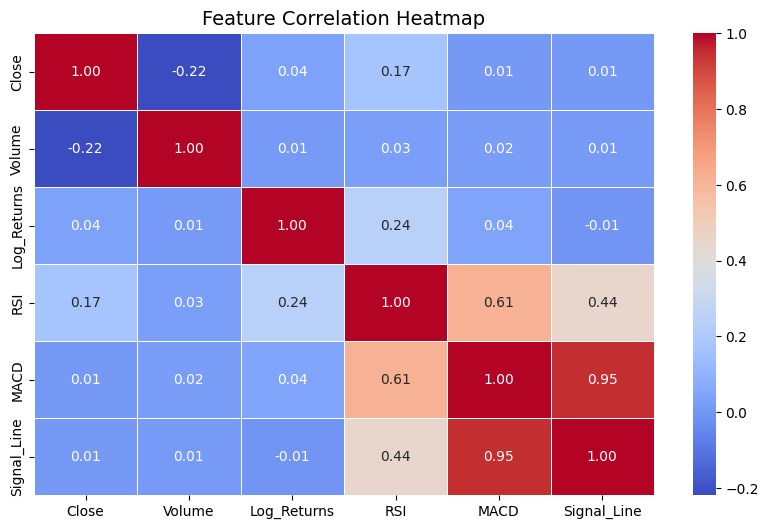

In [13]:
# Correlation Heatmap
plot_correlation_heatmap(df_amazon)

#### Interactive Visualizations

In [14]:
# Interactive Closing Price Plot
plot_close_price(df_amazon, 'Amazon').show()

In [15]:
# Interactive Stock Volatility Analysis
plot_volatility_bollinger(df_amazon, 'Amazon').show()

In [16]:
# MACD and Signal Line Trend Plot
plot_macd_signal(df_amazon, 'Amazon').show()

In [17]:
# RSI Trend
plot_rsi(df_amazon, 'Amazon').show()

In [18]:
# Volume Analysis
plot_volume_analysis(df_amazon, 'Amazon').show()

#### 3.2 Apple Stocks Dataset EDA

In [19]:
# Apple Stocks Dataset
df_apple.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,239.36,45486100,234.12,239.855,234.01,-0.004606,239.360000,53.242718,0.000000,0.000000
1,2025-01-28,238.26,75707570,230.85,240.190,230.81,-0.004606,239.160000,53.242718,-0.087749,-0.017550
2,2025-01-27,229.86,94863420,224.02,232.150,223.98,-0.035892,237.469091,53.242718,-0.825584,-0.179157
3,2025-01-24,222.78,54697910,224.78,225.630,221.41,-0.031286,234.798347,53.242718,-1.959038,-0.535133
4,2025-01-23,223.66,60234760,224.74,227.030,222.30,0.003942,232.773193,53.242718,-2.754547,-0.979016


In [20]:
# Apple stocks dataset information
df_apple.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [21]:
# Apple stocks dataset statistics
df_apple.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,97.871122,1.153409e+08,97.780797,98.822185,96.812539,-0.000837,98.245452,44.701134,-0.578747,-0.578142
min,2015-01-30 00:00:00,22.585000,2.323471e+07,22.500000,22.917500,22.367500,-0.113157,23.333808,3.837044,-7.663092,-7.294868
25%,2017-07-29 12:00:00,38.326250,7.043718e+07,38.397500,38.551250,37.975000,-0.009990,38.352849,31.042789,-1.554108,-1.460498
50%,2020-01-29 00:00:00,69.492500,9.884468e+07,69.300000,70.420000,68.717500,-0.000928,70.392113,44.024458,-0.399236,-0.370433
75%,2022-07-27 12:00:00,154.470000,1.406703e+08,153.875000,156.290000,152.370000,0.007455,154.409563,57.705814,0.356153,0.347289
max,2025-01-29 00:00:00,259.020000,6.475300e+08,258.190000,260.100000,257.630000,0.137708,251.572956,96.857143,5.824733,5.531890
std,NaN,66.019880,6.672306e+07,65.942282,66.626346,65.318448,0.017901,66.155641,17.882222,2.126410,1.990892


In [22]:
# Correlation between Apple stocks dataset features
df_apple.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.950117,-0.564466,0.949974,0.950335,0.949916,-0.008381,0.951586,0.003053,-0.163317,-0.173362
Close,0.950117,1.000000,-0.530803,0.999696,0.999861,0.999860,0.011256,0.999125,0.089374,-0.061057,-0.066407
Volume,-0.564466,-0.530803,1.000000,-0.530318,-0.527102,-0.534060,0.002706,-0.531681,0.051401,0.089672,0.088559
Open,0.949974,0.999696,-0.530318,1.000000,0.999861,0.999857,0.011070,0.998804,0.089764,-0.061480,-0.067052
High,0.950335,0.999861,-0.527102,0.999861,1.000000,0.999817,0.010806,0.998995,0.089484,-0.061636,-0.067031
Low,0.949916,0.999860,-0.534060,0.999857,0.999817,1.000000,0.010303,0.999004,0.088898,-0.061785,-0.067177
Log_Returns,-0.008381,0.011256,0.002706,0.011070,0.010806,0.010303,1.000000,-0.009051,0.238214,0.056904,0.007506
EMA_10,0.951586,0.999125,-0.531681,0.998804,0.998995,0.999004,-0.009051,1.000000,0.063673,-0.082785,-0.078675
RSI,0.003053,0.089374,0.051401,0.089764,0.089484,0.088898,0.238214,0.063673,1.000000,0.615724,0.458271
MACD,-0.163317,-0.061057,0.089672,-0.061480,-0.061636,-0.061785,0.056904,-0.082785,0.615724,1.000000,0.949405


In [23]:
# Checking stationarity of Log Returns
result = adfuller(df_apple['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -15.55739325808057
p-value: 2.0631426888076356e-28
The Log Returns series is stationary.


#### Static Visualizations

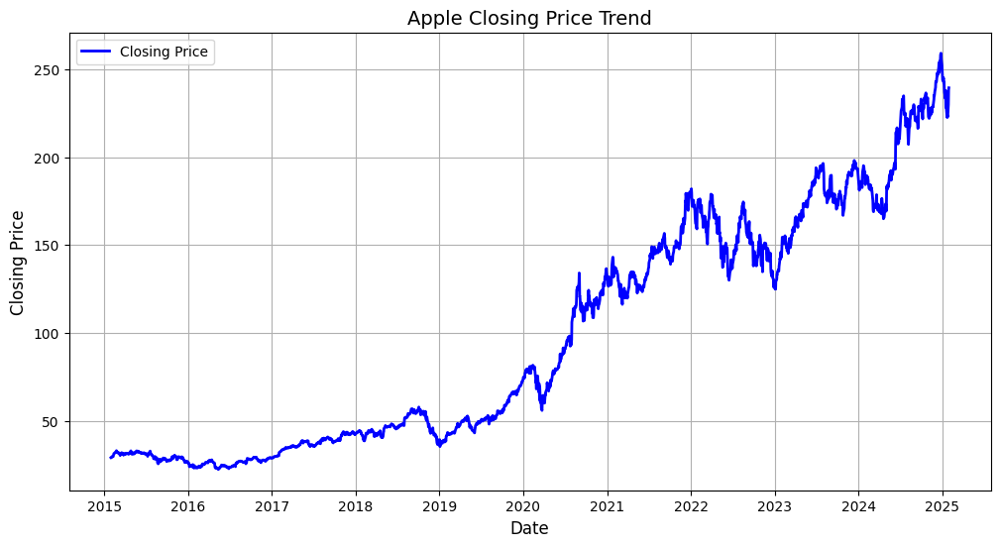

In [24]:
# Closing Price Line Plot
plot_closing_price(df_apple, 'Apple')

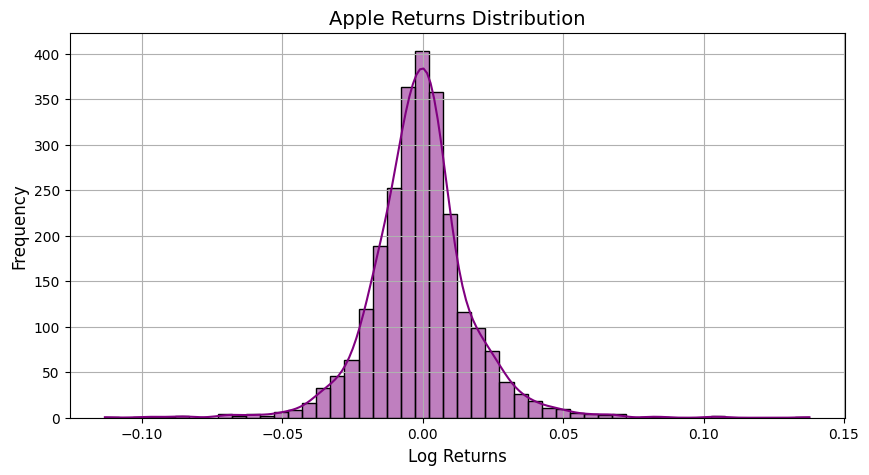

In [25]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_apple, 'Apple')

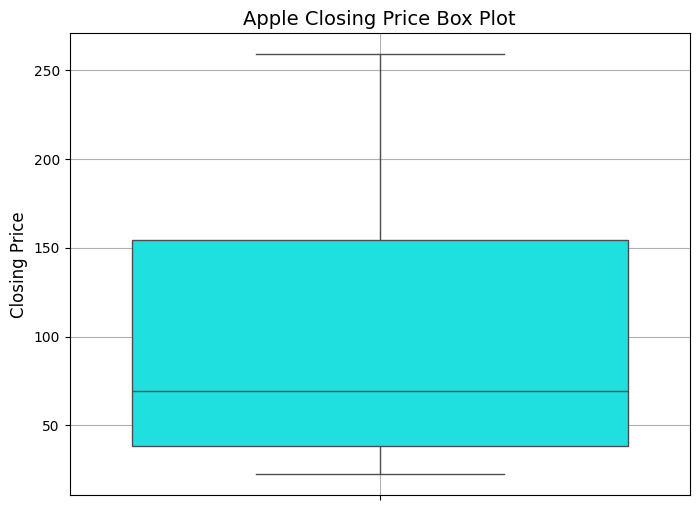

In [26]:
# Box plot of Closing Prices
plot_boxplot_closing(df_apple, 'Apple')

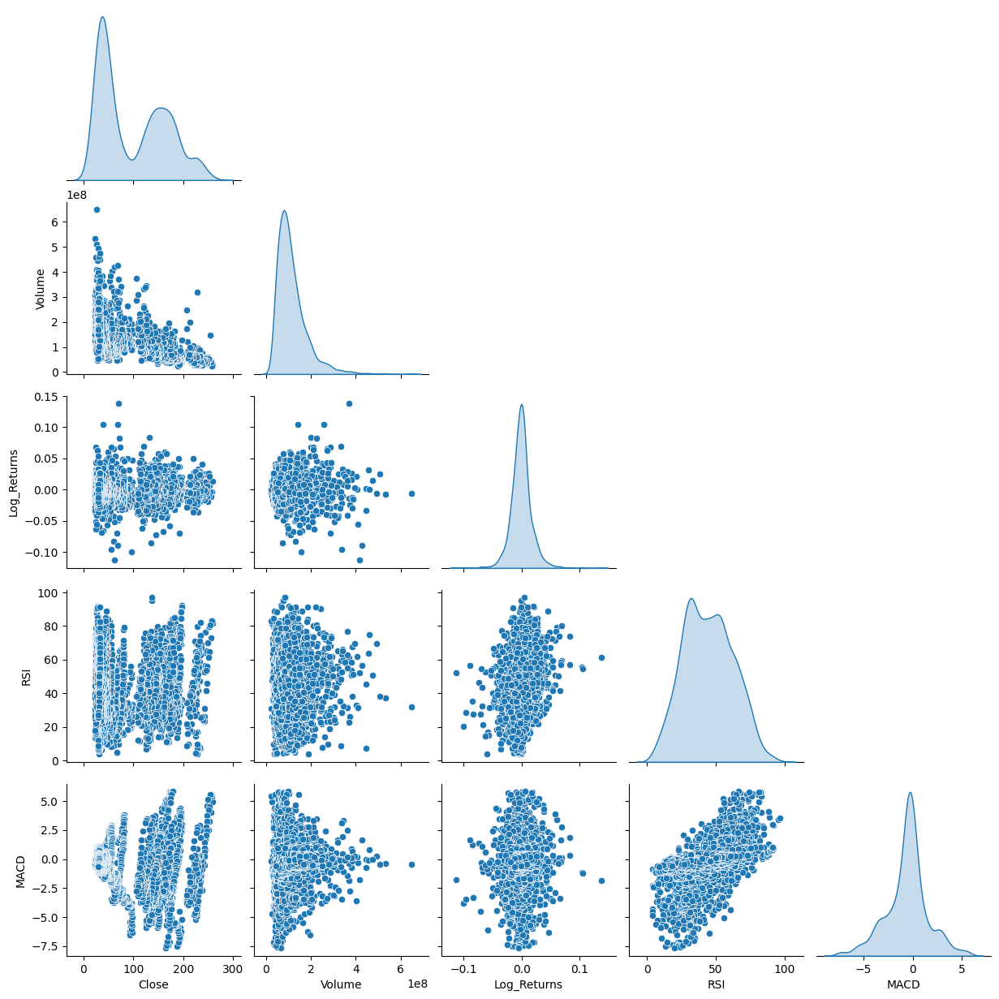

In [27]:
# Pairplot for features relationships
plot_pairplot(df_apple)

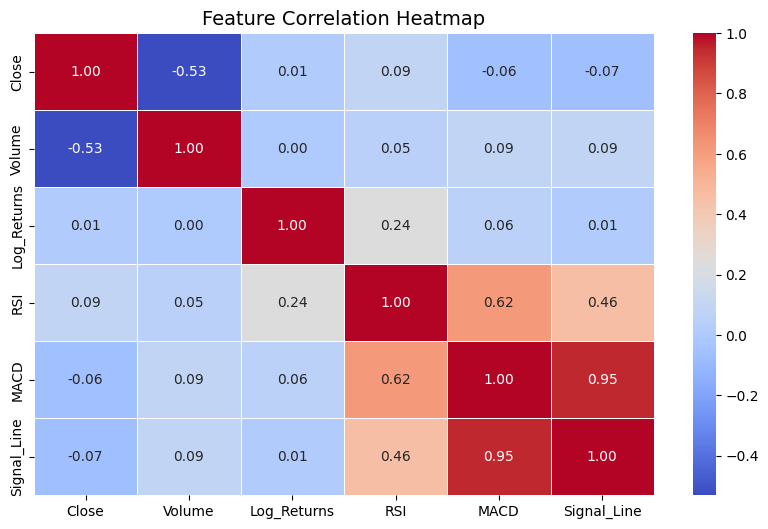

In [28]:
# Correlation Heatmap
plot_correlation_heatmap(df_apple)

#### Interactive Visualizations

In [29]:
# Interactive Closing Price Plot
plot_close_price(df_apple, 'Apple').show()

In [30]:
# Interactive Stock Volatility Analysis
plot_volatility_bollinger(df_apple, 'Apple').show()

In [31]:
# MACD and Signal Line Trend Plot
plot_macd_signal(df_apple, 'Apple').show()

In [32]:
# RSI Trend
plot_rsi(df_apple, 'Apple').show()

In [33]:
# Volume Analysis
plot_volume_analysis(df_apple, 'Apple').show()

#### Google Stocks Dataset EDA

In [34]:
# Google Stocks Dataset
df_google.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,195.41,18218260,195.555,196.785,193.43,-0.000563,195.410000,47.781155,0.000000,0.000000
1,2025-01-28,195.30,24157930,192.745,195.480,190.68,-0.000563,195.390000,47.781155,-0.008775,-0.001755
2,2025-01-27,191.81,41728890,192.410,196.880,190.73,-0.018032,194.739091,47.781155,-0.293954,-0.060195
3,2025-01-24,200.21,23877520,198.100,200.900,198.00,0.042862,195.733802,47.781155,0.156050,-0.016946
4,2025-01-23,197.98,26951360,198.140,200.300,195.20,-0.011201,196.142201,47.781155,0.328947,0.052233


In [35]:
# Google stocks dataset information
df_google.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [36]:
# Google stocks dataset statistics
df_google.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,83.945683,3.493989e+07,83.907173,84.805318,83.049060,-0.000789,84.247393,45.026651,-0.467478,-0.466972
min,2015-01-30 00:00:00,26.305000,9.312760e+06,25.950000,26.534500,25.909000,-0.150645,26.767976,1.906281,-6.909800,-5.862049
25%,2017-07-29 12:00:00,47.876000,2.462973e+07,47.843000,48.074550,47.417700,-0.009599,48.098765,33.741359,-1.129001,-1.055505
50%,2020-01-29 00:00:00,65.866000,3.077414e+07,65.771000,66.399000,65.473700,-0.001229,65.883474,45.244421,-0.415896,-0.401719
75%,2022-07-27 12:00:00,121.690000,3.976774e+07,121.205000,122.438000,119.956750,0.007455,121.908563,56.661225,0.245573,0.194275
max,2025-01-29 00:00:00,200.210000,2.569376e+08,199.070000,202.290000,198.000000,0.123685,196.820482,86.352357,6.491462,5.842278
std,NaN,44.465095,1.687681e+07,44.446148,44.955792,43.980898,0.017886,44.576718,15.834985,1.633836,1.526173


In [37]:
# Correlation between Google stocks dataset features
df_google.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.928394,-0.214914,0.927970,0.929158,0.927466,0.000261,0.929802,0.032587,-0.155062,-0.164887
Close,0.928394,1.000000,-0.233955,0.999556,0.999791,0.999819,0.016648,0.998713,0.082645,-0.068897,-0.076116
Volume,-0.214914,-0.233955,1.000000,-0.232127,-0.227686,-0.238317,0.013776,-0.233173,0.029111,-0.007910,-0.006959
Open,0.927970,0.999556,-0.232127,1.000000,0.999810,0.999791,0.015456,0.998361,0.081303,-0.069842,-0.076725
High,0.929158,0.999791,-0.227686,0.999810,1.000000,0.999768,0.015804,0.998564,0.082296,-0.069297,-0.076188
Low,0.927466,0.999819,-0.238317,0.999791,0.999768,1.000000,0.015448,0.998563,0.081709,-0.069301,-0.076500
Log_Returns,0.000261,0.016648,0.013776,0.015456,0.015804,0.015448,1.000000,-0.009767,0.229484,0.034579,-0.013531
EMA_10,0.929802,0.998713,-0.233173,0.998361,0.998564,0.998563,-0.009767,1.000000,0.050988,-0.094015,-0.089816
RSI,0.032587,0.082645,0.029111,0.081303,0.082296,0.081709,0.229484,0.050988,1.000000,0.585832,0.408629
MACD,-0.155062,-0.068897,-0.007910,-0.069842,-0.069297,-0.069301,0.034579,-0.094015,0.585832,1.000000,0.947698


In [38]:
# Checking stationarity of Log Returns
result = adfuller(df_google['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -17.178648020716917
p-value: 6.66951348088693e-30
The Log Returns series is stationary.


#### Static Visualizations

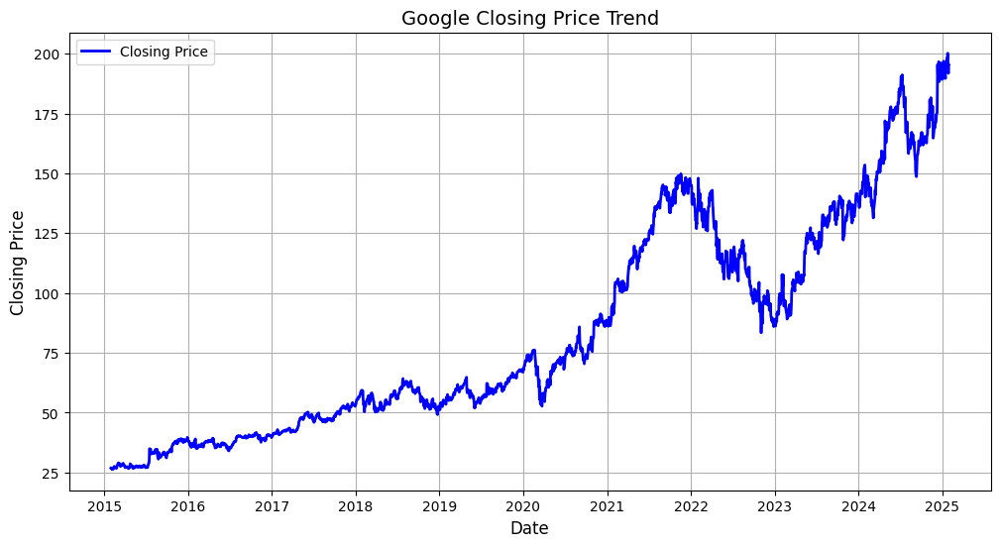

In [39]:
# Closing Price Line Plot
plot_closing_price(df_google, 'Google')

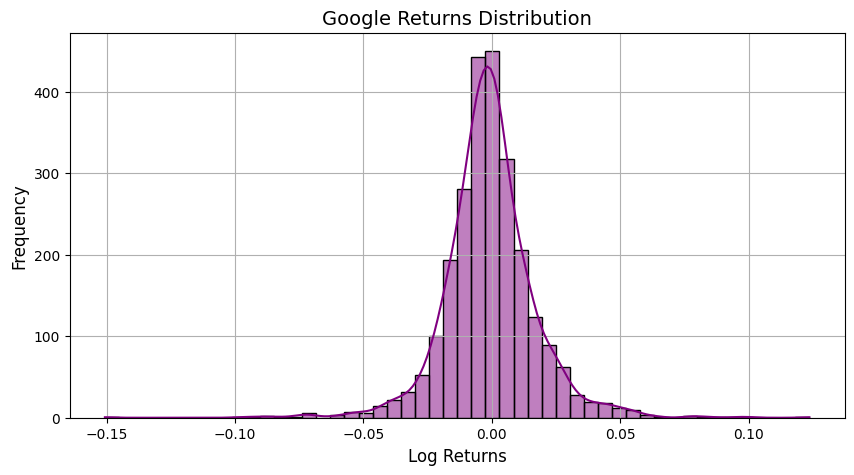

In [40]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_google, 'Google')

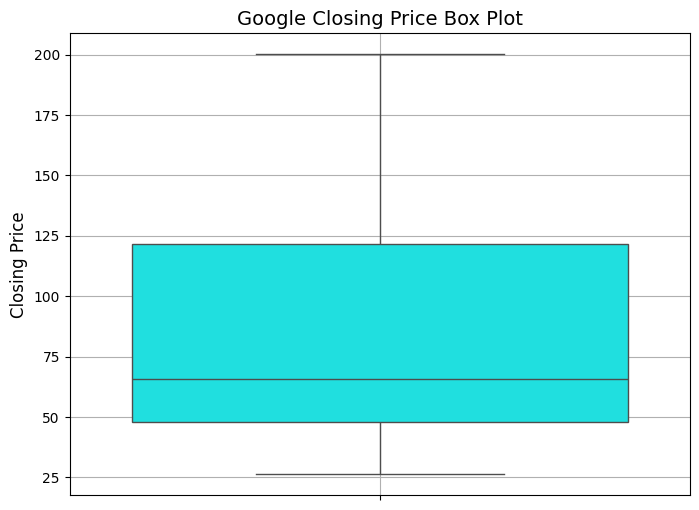

In [41]:
# Box plot of Closing Prices
plot_boxplot_closing(df_google, 'Google')

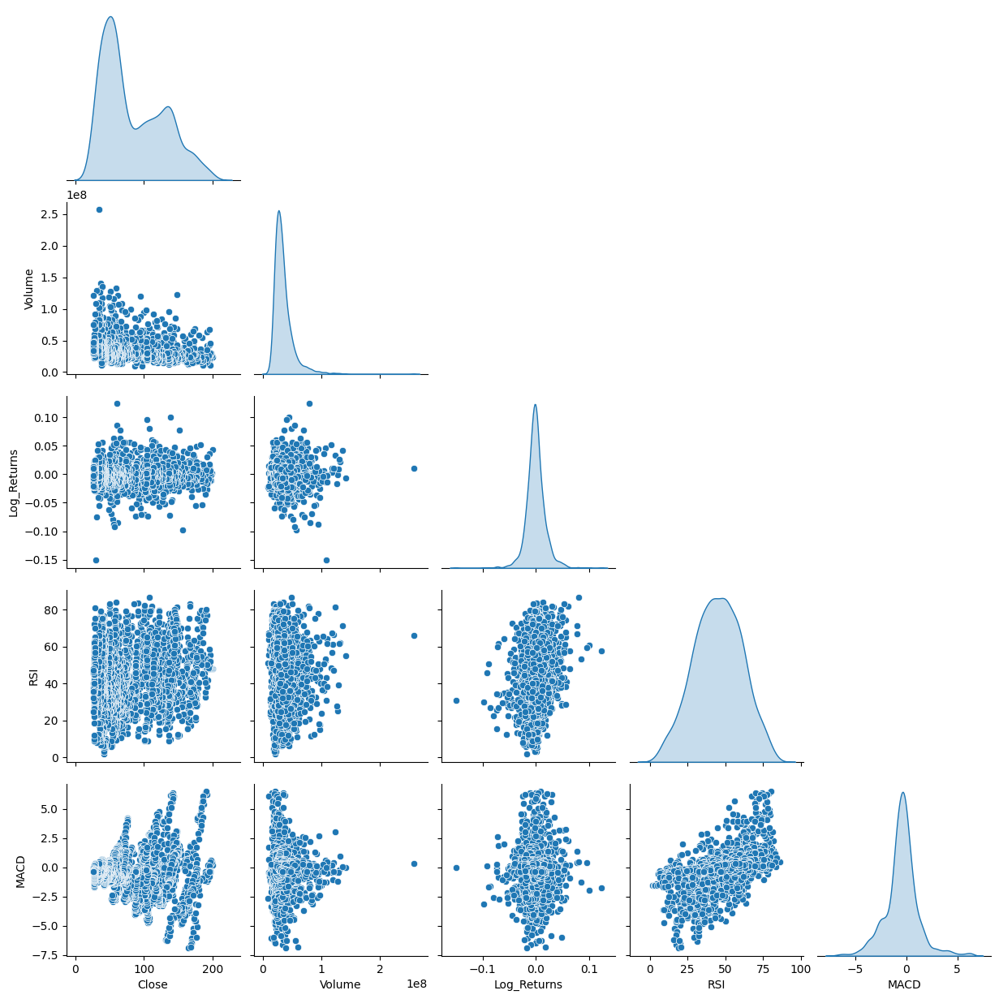

In [42]:
# Pairplot for features relationships
plot_pairplot(df_google)

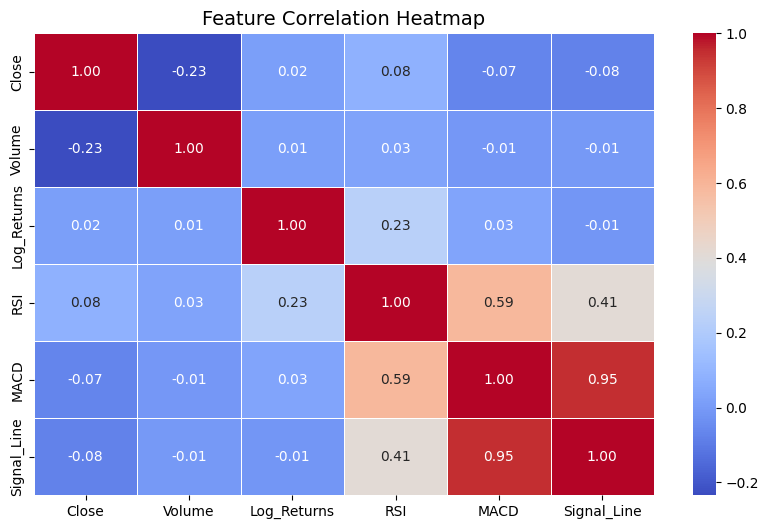

In [43]:
# Correlation Heatmap
plot_correlation_heatmap(df_google)

#### Interactive Visualizations

In [44]:
# Interactive Closing Price Plot
plot_close_price(df_google, 'Google').show()

In [45]:
# Interactive Stock Volatility Analysis
plot_volatility_bollinger(df_google, 'Google').show()

In [46]:
# MACD and Signal Line Trend Plot
plot_macd_signal(df_google, 'Google').show()

In [47]:
# RSI Trend
plot_rsi(df_google, 'Google').show()

In [48]:
# Volume Analysis
plot_volume_analysis(df_google, 'Google').show()

#### Meta Stocks Dataset EDA

In [49]:
# Meta Stocks Dataset
df_meta.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,676.49,21377820,675.00,681.0459,665.670,-0.003198,676.490000,22.738954,0.000000,0.000000
1,2025-01-28,674.33,20950110,666.00,682.5800,659.465,-0.003198,676.097273,22.738954,-0.172308,-0.034462
2,2025-01-27,659.88,28399190,626.61,663.8700,625.100,-0.021662,673.148678,22.738954,-1.458050,-0.319179
3,2025-01-24,647.49,19065330,636.40,652.0000,634.200,-0.018955,668.483464,22.738954,-3.437157,-0.942775
4,2025-01-23,636.45,9910163,627.36,636.6000,621.150,-0.017197,662.659197,22.738954,-5.829254,-1.920071


In [50]:
# Meta stocks dataset information
df_meta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [51]:
# Meta stocks dataset statistics
df_meta.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,226.232501,2.273591e+07,226.105628,228.998275,223.294512,-0.000871,227.307384,45.011272,-1.665247,-1.663184
min,2015-01-30 00:00:00,74.440000,4.726056e+06,74.050000,74.830000,72.000000,-0.209307,75.714203,3.483409,-27.346951,-25.414059
25%,2017-07-29 12:00:00,138.645000,1.432518e+07,138.085000,139.965000,136.628300,-0.012216,139.192451,32.793172,-4.305048,-4.191316
50%,2020-01-29 00:00:00,184.190000,1.906838e+07,183.770000,185.990000,182.110000,-0.001056,184.016593,44.343303,-1.446979,-1.441986
75%,2022-07-27 12:00:00,285.395000,2.625095e+07,284.755000,289.322500,280.392500,0.009142,284.927848,56.379386,0.783851,0.816123
max,2025-01-29 00:00:00,676.490000,2.323166e+08,675.000000,682.580000,665.670000,0.306391,676.490000,90.231927,26.874056,25.601028
std,NaN,125.720567,1.483661e+07,125.675072,127.234450,124.046020,0.023863,126.697051,15.869417,6.168853,5.853433


In [52]:
# Correlation between Meta stocks dataset features
df_meta.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.784177,-0.064308,0.783741,0.786445,0.782363,-0.007890,0.785419,-0.013399,-0.229589,-0.240982
Close,0.784177,1.000000,-0.256010,0.999434,0.999746,0.999759,0.006647,0.998147,0.017098,-0.182374,-0.187885
Volume,-0.064308,-0.256010,1.000000,-0.255325,-0.249348,-0.261839,0.036752,-0.257208,0.033932,0.028912,0.020152
Open,0.783741,0.999434,-0.255325,1.000000,0.999743,0.999731,0.006034,0.997675,0.015890,-0.183190,-0.188243
High,0.786445,0.999746,-0.249348,0.999743,1.000000,0.999689,0.006369,0.997936,0.016933,-0.182752,-0.188162
Low,0.782363,0.999759,-0.261839,0.999731,0.999689,1.000000,0.005539,0.997989,0.016345,-0.182660,-0.187837
Log_Returns,-0.007890,0.006647,0.036752,0.006034,0.006369,0.005539,1.000000,-0.024853,0.230931,0.065046,0.027115
EMA_10,0.785419,0.998147,-0.257208,0.997675,0.997936,0.997989,-0.024853,1.000000,-0.021810,-0.214032,-0.207824
RSI,-0.013399,0.017098,0.033932,0.015890,0.016933,0.016345,0.230931,-0.021810,1.000000,0.629296,0.486614
MACD,-0.229589,-0.182374,0.028912,-0.183190,-0.182752,-0.182660,0.065046,-0.214032,0.629296,1.000000,0.959324


In [53]:
# Checking stationarity of Log Returns
result = adfuller(df_meta['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -17.283845904313452
p-value: 5.7598627282174964e-30
The Log Returns series is stationary.


#### Static Visualizations

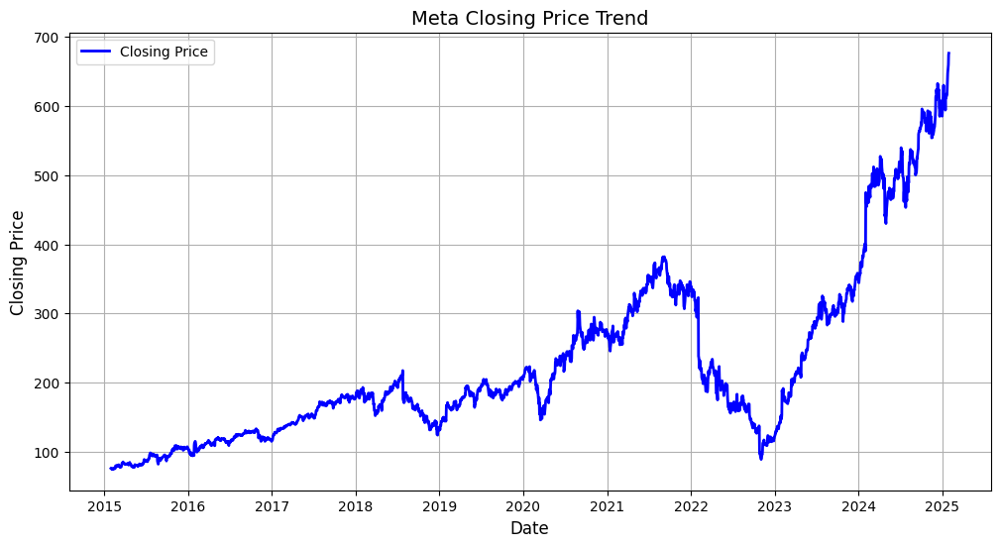

In [54]:
# Closing Price Line Plot
plot_closing_price(df_meta, 'Meta')

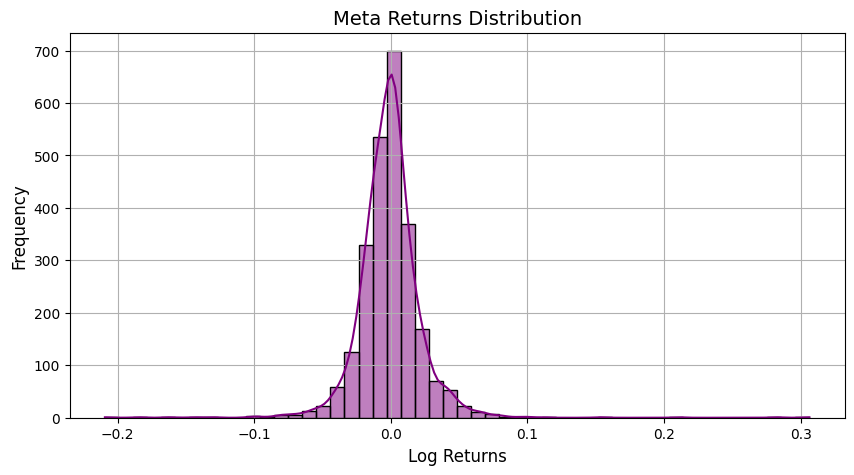

In [55]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_meta, 'Meta')

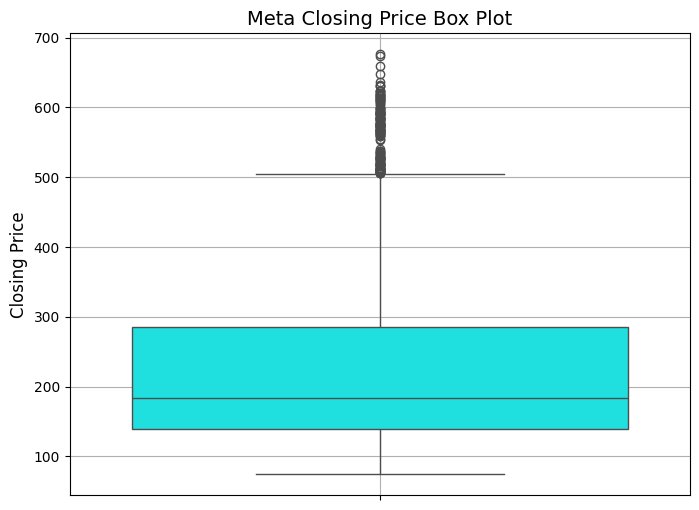

In [56]:
# Box plot of Closing Prices
plot_boxplot_closing(df_meta, 'Meta')

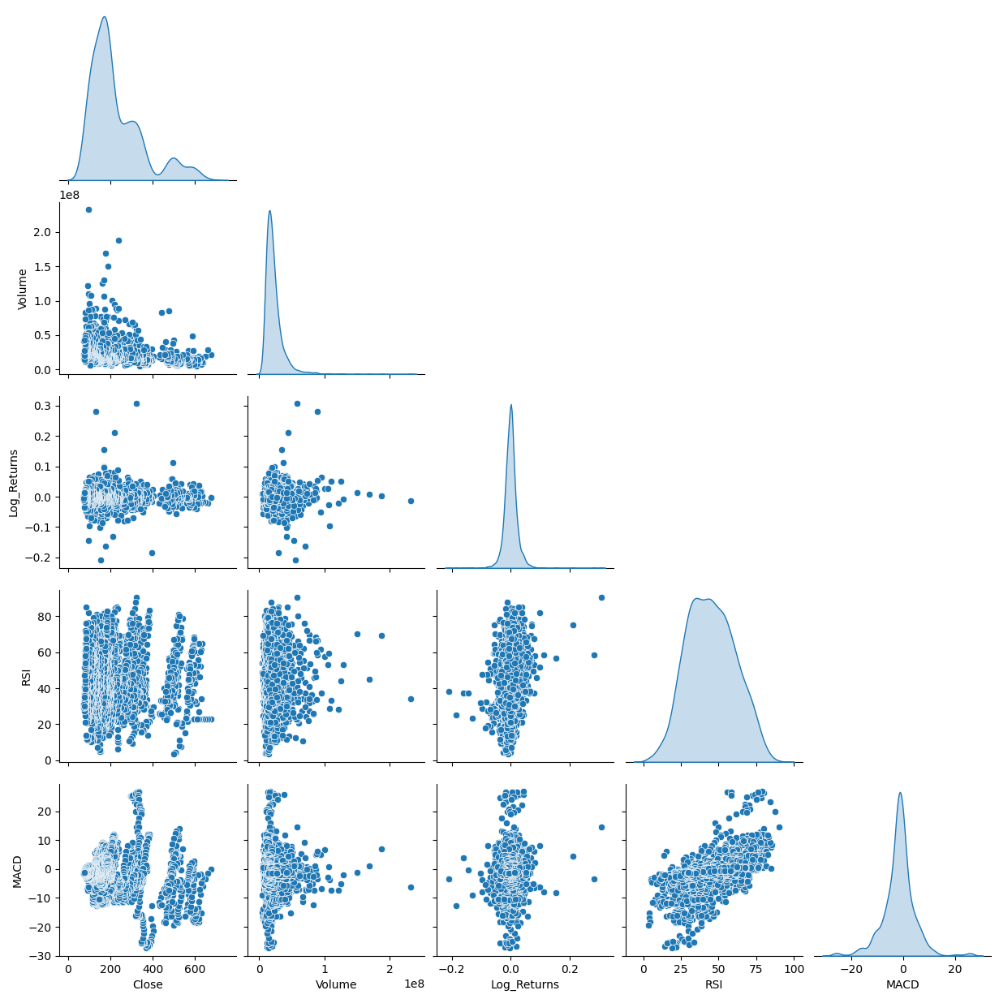

In [57]:
# Pairplot for features relationships
plot_pairplot(df_meta)

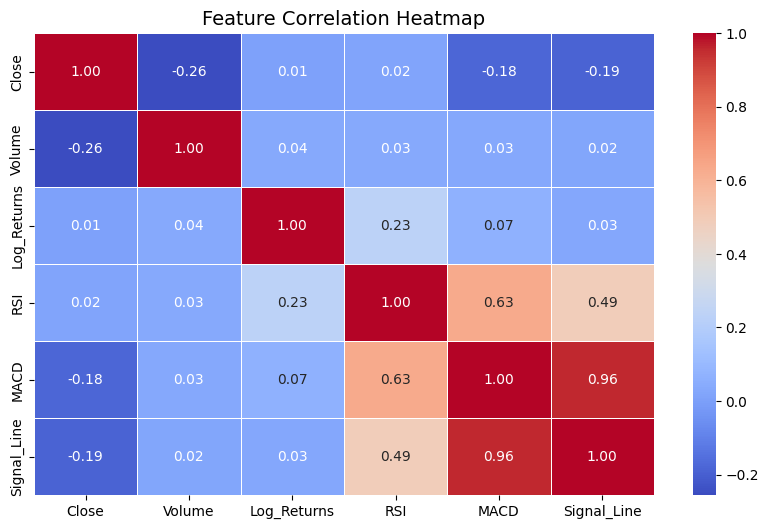

In [58]:
# Correlation Heatmap
plot_correlation_heatmap(df_meta)

#### Interactive Visualizations

In [59]:
# Interactive Closing Price Plot
plot_close_price(df_meta, 'Meta').show()

In [60]:
# Interactive Stock Volatility Analysis
plot_volatility_bollinger(df_meta, 'Meta').show()

In [61]:
# MACD and Signal Line Trend Plot
plot_macd_signal(df_meta, 'Meta').show()

In [62]:
# RSI Trend
plot_rsi(df_meta, 'Meta').show()

In [63]:
# Volume Analysis
plot_volume_analysis(df_meta, 'Meta').show()

#### Microsoft Stocks Dataset EDA

In [64]:
# Microsoft Stocks Dataset
df_micro.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,442.33,23581370,446.69,446.88,440.4000,0.010950,442.330000,38.011065,0.000000,0.000000
1,2025-01-28,447.20,23491700,434.60,448.38,431.3800,0.010950,443.215455,38.011065,0.388490,0.077698
2,2025-01-27,434.56,35647810,424.01,435.20,423.5000,-0.028672,441.641736,38.011065,-0.319884,-0.001818
3,2025-01-24,444.06,15549450,445.16,446.65,441.4000,0.021626,442.081420,38.011065,-0.113397,-0.024134
4,2025-01-23,446.71,18389270,442.00,446.75,441.5048,0.005950,442.922980,38.011065,0.261068,0.032906


In [65]:
# Microsoft stocks dataset information
df_micro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [66]:
# Microsoft stocks dataset statistics
df_micro.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,190.507545,2.863917e+07,190.457270,192.267882,188.560690,-0.000947,191.223992,44.139725,-1.111789,-1.111545
min,2015-01-30 00:00:00,40.290000,7.164543e+06,40.340000,40.740000,39.720000,-0.132929,41.258245,0.888099,-11.648327,-10.365317
25%,2017-07-29 12:00:00,72.685000,2.045304e+07,72.592500,73.110000,72.250000,-0.009747,72.924734,33.088116,-2.473565,-2.400347
50%,2020-01-29 00:00:00,158.670000,2.555107e+07,158.160000,159.945000,156.730000,-0.000912,160.529108,44.156456,-0.812158,-0.806974
75%,2022-07-27 12:00:00,286.400000,3.297741e+07,286.105000,289.505000,283.005000,0.006787,287.791621,54.994825,0.111115,0.032889
max,2025-01-29 00:00:00,467.560000,1.351529e+08,467.000000,468.350000,464.460000,0.159453,457.219514,93.286529,12.552479,10.729261
std,NaN,123.966937,1.299165e+07,123.959267,125.038941,122.775361,0.016973,124.155573,15.515641,3.270995,3.030681


In [67]:
# Correlation between Microsoft stocks dataset features
df_micro.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.961523,-0.166944,0.961473,0.962095,0.961045,0.008919,0.962602,0.051360,-0.144989,-0.154601
Close,0.961523,1.000000,-0.181644,0.999718,0.999864,0.999880,0.023571,0.999309,0.102663,-0.062851,-0.070773
Volume,-0.166944,-0.181644,1.000000,-0.180567,-0.175970,-0.186036,-0.020776,-0.180947,0.055076,-0.009435,-0.014103
Open,0.961473,0.999718,-0.180567,1.000000,0.999883,0.999870,0.021455,0.999108,0.101894,-0.063925,-0.071586
High,0.962095,0.999864,-0.175970,0.999883,1.000000,0.999841,0.021899,0.999232,0.102583,-0.063536,-0.071269
Low,0.961045,0.999880,-0.186036,0.999870,0.999841,1.000000,0.021961,0.999234,0.101905,-0.063627,-0.071532
Log_Returns,0.008919,0.023571,-0.020776,0.021455,0.021899,0.021961,1.000000,0.005259,0.223320,0.027122,-0.022512
EMA_10,0.962602,0.999309,-0.180947,0.999108,0.999232,0.999234,0.005259,1.000000,0.079888,-0.080954,-0.079802
RSI,0.051360,0.102663,0.055076,0.101894,0.102583,0.101905,0.223320,0.079888,1.000000,0.587143,0.405389
MACD,-0.144989,-0.062851,-0.009435,-0.063925,-0.063536,-0.063627,0.027122,-0.080954,0.587143,1.000000,0.941788


In [68]:
# Checking stationarity of Log Returns
result = adfuller(df_micro['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -17.25043131145356
p-value: 6.028278512216238e-30
The Log Returns series is stationary.


#### Static Visualizations

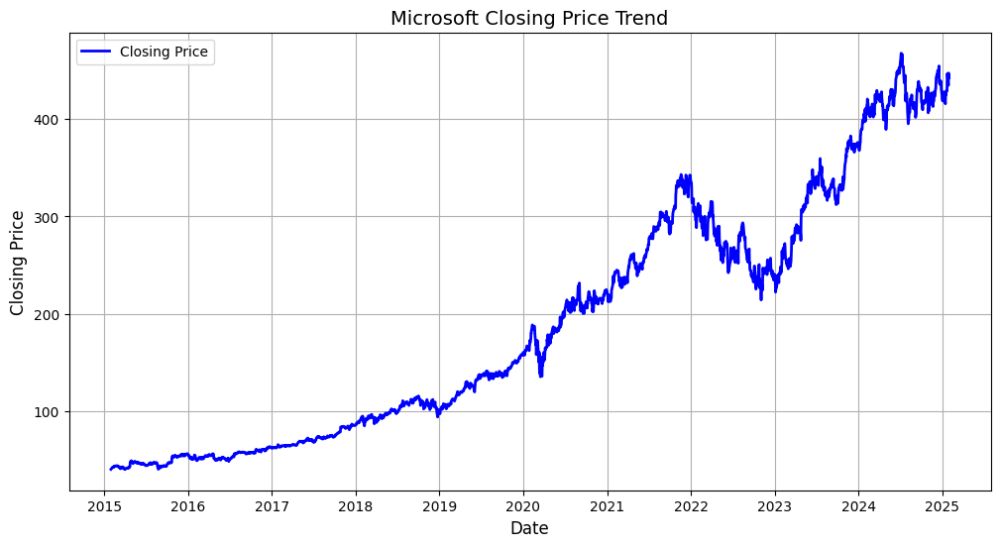

In [69]:
# Closing Price Line Plot
plot_closing_price(df_micro, 'Microsoft')

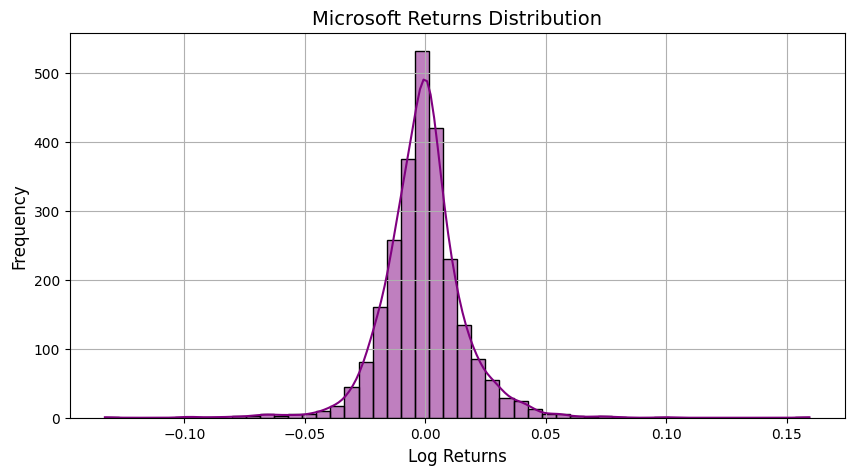

In [70]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_micro, 'Microsoft')

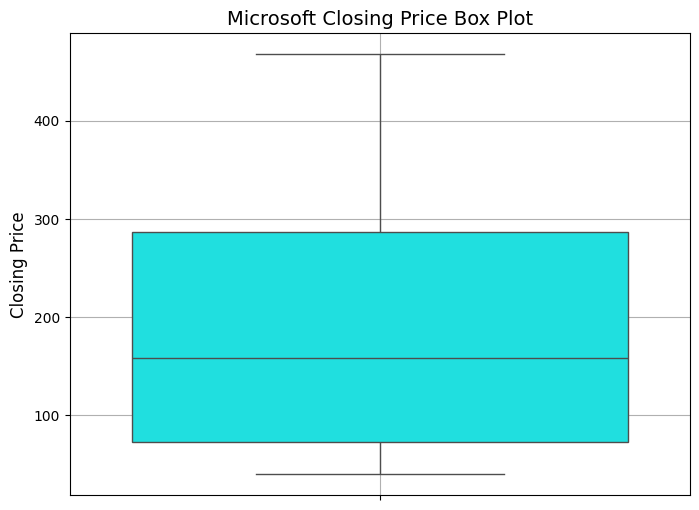

In [71]:
# Box plot of Closing Prices
plot_boxplot_closing(df_micro, 'Microsoft')

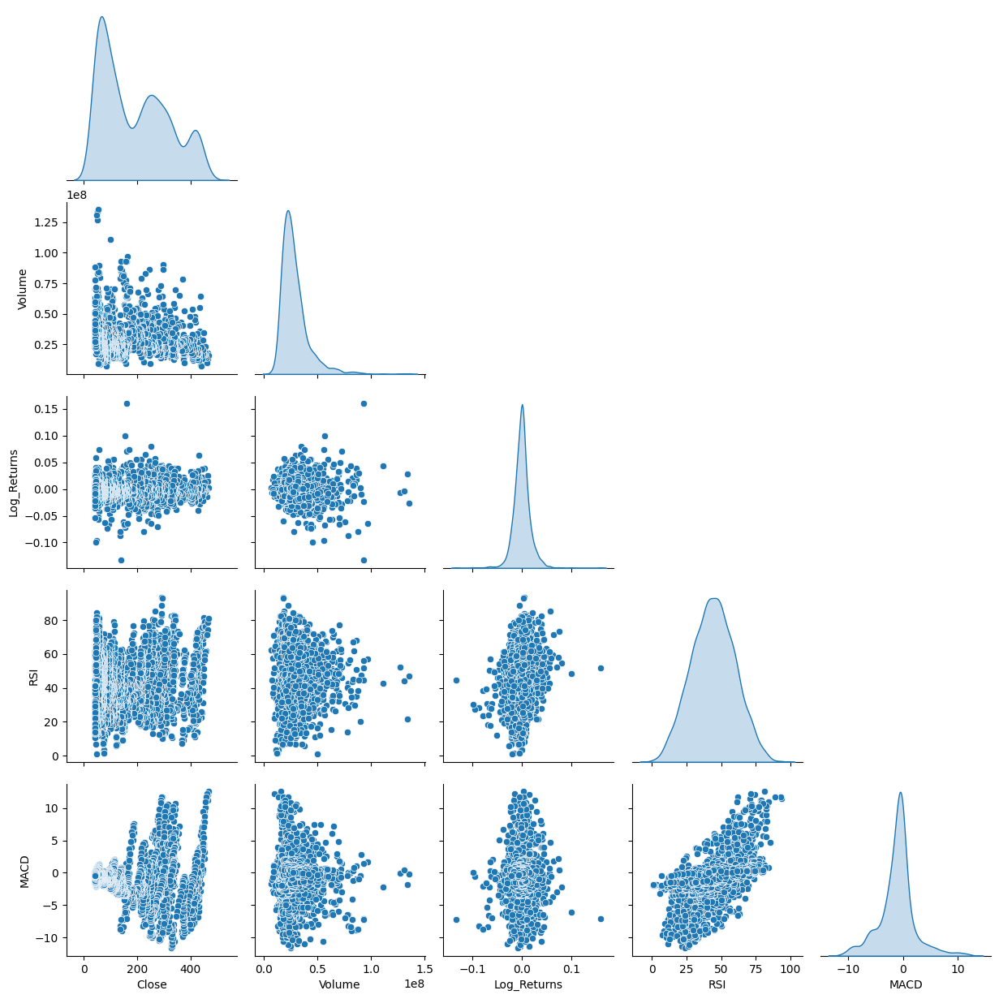

In [72]:
# Pairplot for features relationships
plot_pairplot(df_micro)

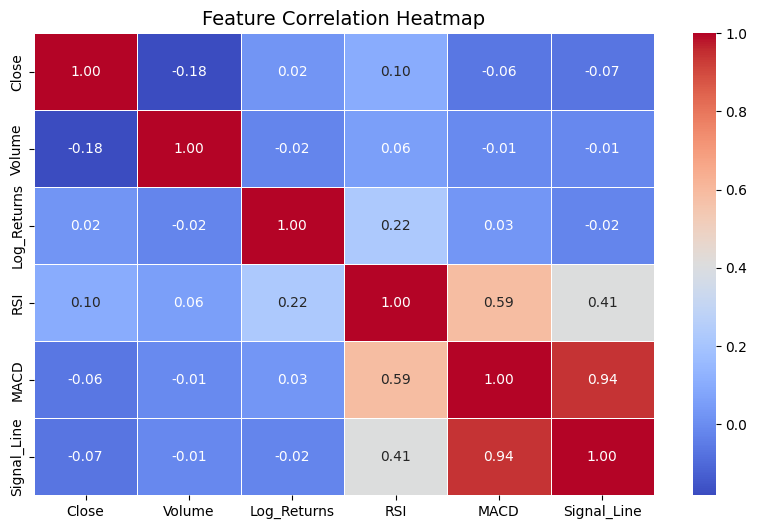

In [73]:
# Correlation Heatmap
plot_correlation_heatmap(df_micro)

#### Interactive Visualizations

In [74]:
# Interactive Closing Price Plot
plot_close_price(df_micro, 'Microsoft').show()

In [75]:
# Interactive Stock Volatility Analysis
plot_volatility_bollinger(df_micro, 'Microsoft').show()

In [76]:
# MACD and Signal Line Trend Plot
plot_macd_signal(df_micro, 'Microsoft').show()

In [77]:
# RSI Trend
plot_rsi(df_micro, 'Microsoft').show()

In [78]:
# Volume Analysis
plot_volume_analysis(df_micro, 'Microsoft').show()

#### Netflix Stocks Dataset EDA

In [79]:
# Netflix Stocks Dataset
df_netflix.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,978.15,2930728,980.00,987.640,968.2345,-0.006482,978.150000,28.455658,0.000000,0.000000
1,2025-01-28,971.83,3433972,966.71,977.934,957.3000,-0.006482,977.000909,28.455658,-0.504160,-0.100832
2,2025-01-27,971.89,4634204,971.10,982.270,960.2600,0.000062,976.071653,28.455658,-0.888625,-0.258390
3,2025-01-24,977.59,4550397,984.41,986.280,967.6800,0.005848,976.347716,28.455658,-0.725016,-0.351716
4,2025-01-23,984.86,7752137,957.81,985.000,953.9000,0.007409,977.895404,28.455658,-0.008627,-0.283098


In [80]:
# Netflix stocks dataset information
df_netflix.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [81]:
# Netflix stocks dataset statistics
df_netflix.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,342.147169,8.756616e+06,342.080187,347.062174,336.990364,-0.001092,343.782209,45.751958,-2.539439,-2.538850
min,2015-01-30 00:00:00,59.017100,1.143952e+06,58.768600,59.607100,58.464300,-0.174189,60.787935,3.795531,-37.511174,-33.877610
25%,2017-07-29 12:00:00,168.655000,4.224743e+06,168.905000,170.908150,165.975000,-0.014253,172.087236,32.687890,-7.647979,-7.474675
50%,2020-01-29 00:00:00,333.700000,6.463245e+06,334.050000,338.500000,329.130000,-0.000448,336.337605,44.979618,-2.592168,-2.745375
75%,2022-07-27 12:00:00,485.130000,1.065860e+07,485.380000,491.580000,478.800000,0.011354,489.223889,58.490973,1.351403,0.987070
max,2025-01-29 00:00:00,984.860000,1.333875e+08,998.025000,999.000000,968.234500,0.432578,978.150000,97.459238,51.311224,47.658965
std,NaN,194.110325,7.840614e+06,194.156829,196.335571,191.874273,0.027637,195.023725,17.363528,10.949296,10.372981


In [82]:
# Correlation between Netflix stocks dataset features
df_netflix.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.803307,-0.395901,0.802883,0.804179,0.802499,0.006159,0.805188,0.011435,-0.152630,-0.159849
Close,0.803307,1.000000,-0.427124,0.999291,0.999679,0.999693,0.023320,0.997585,0.069786,-0.054406,-0.053388
Volume,-0.395901,-0.427124,1.000000,-0.427788,-0.422675,-0.433010,0.022924,-0.429074,0.038022,0.058182,0.052795
Open,0.802883,0.999291,-0.427788,1.000000,0.999668,0.999671,0.021619,0.996955,0.069282,-0.054085,-0.052741
High,0.804179,0.999679,-0.422675,0.999668,1.000000,0.999601,0.021984,0.997335,0.069774,-0.053988,-0.052655
Low,0.802499,0.999693,-0.433010,0.999671,0.999601,1.000000,0.021746,0.997385,0.068505,-0.055454,-0.054320
Log_Returns,0.006159,0.023320,0.022924,0.021619,0.021984,0.021746,1.000000,-0.011949,0.238897,0.061033,0.016360
EMA_10,0.805188,0.997585,-0.429074,0.996955,0.997335,0.997385,-0.011949,1.000000,0.024482,-0.092128,-0.077425
RSI,0.011435,0.069786,0.038022,0.069282,0.069774,0.068505,0.238897,0.024482,1.000000,0.632916,0.475988
MACD,-0.152630,-0.054406,0.058182,-0.054085,-0.053988,-0.055454,0.061033,-0.092128,0.632916,1.000000,0.958175


In [83]:
# Checking stationarity of Log Returns
result = adfuller(df_netflix['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -34.57015442875884
p-value: 0.0
The Log Returns series is stationary.


#### Static Visualizations

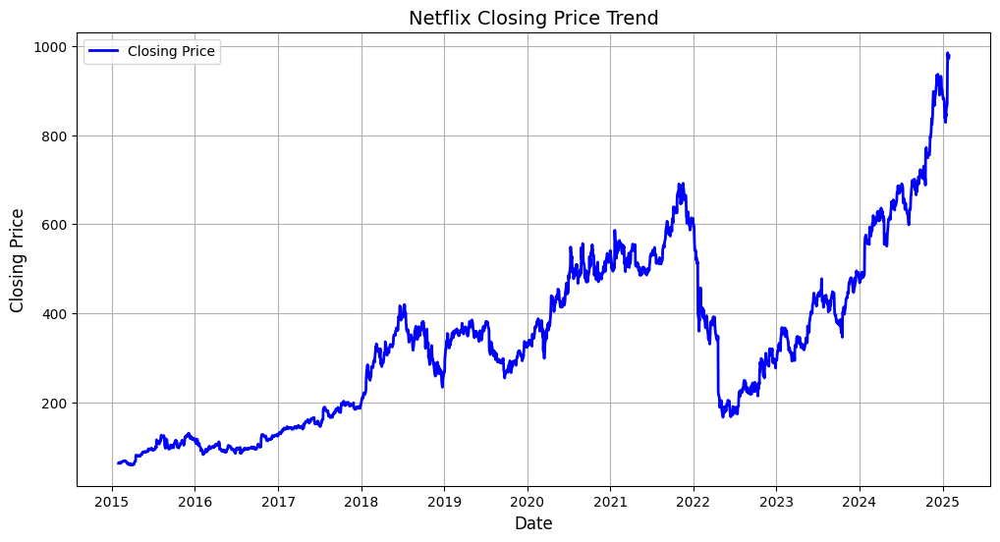

In [84]:
# Closing Price Line Plot
plot_closing_price(df_netflix, 'Netflix')

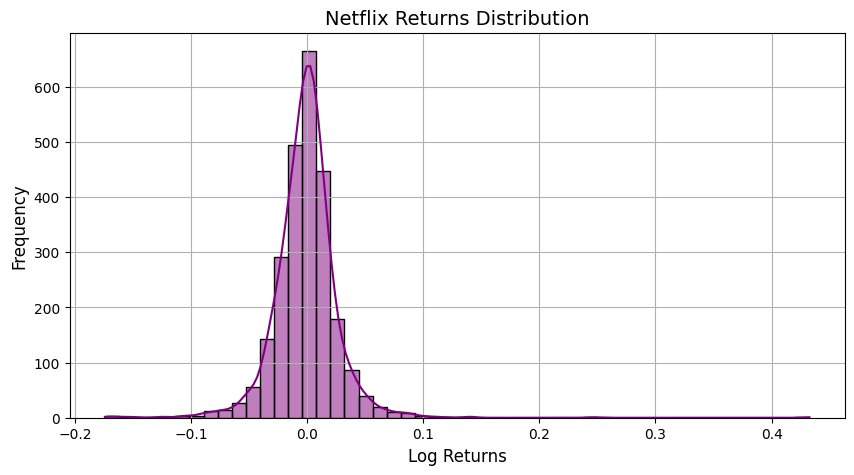

In [85]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_netflix, 'Netflix')

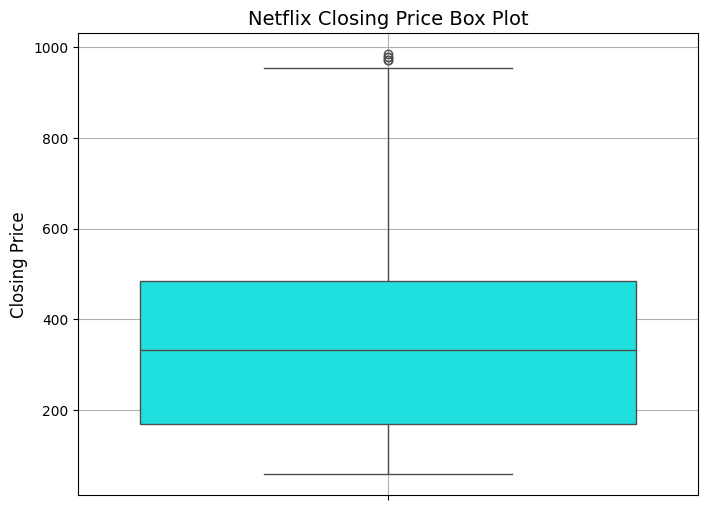

In [86]:
# Box plot of Closing Prices
plot_boxplot_closing(df_netflix, 'Netflix')

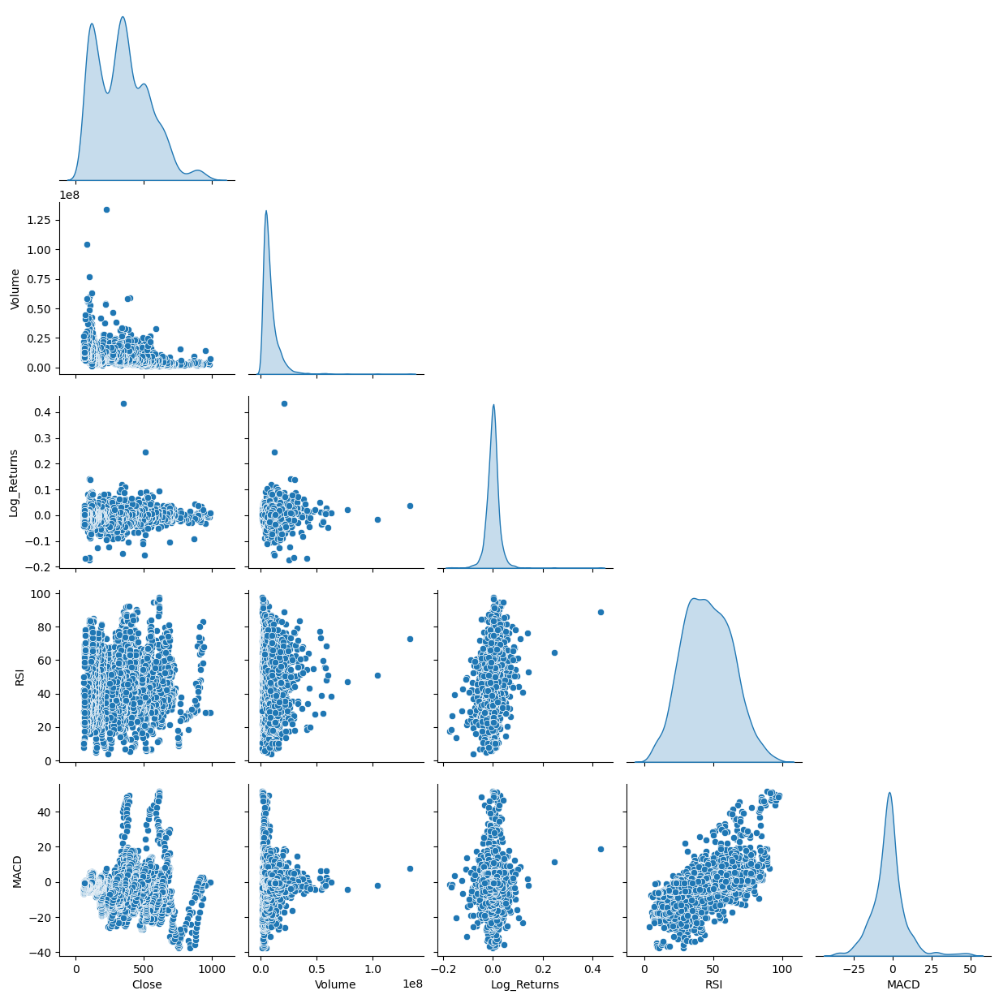

In [87]:
# Pairplot for features relationships
plot_pairplot(df_netflix)

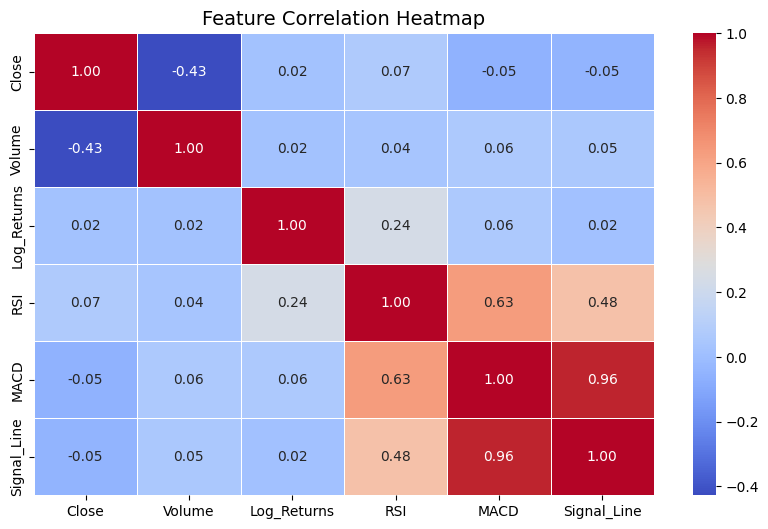

In [88]:
# Correlation Heatmap
plot_correlation_heatmap(df_netflix)

#### Interactive Visualizations

In [89]:
# Interactive Closing Price
plot_close_price(df_netflix,'Netflix').show()

In [90]:
# Stock Volatility Analysis
plot_volatility_bollinger(df_netflix, 'Netflix').show()

In [91]:
# MACD & Signal Line Trend
plot_macd_signal(df_netflix, 'Netflix').show()

In [92]:
# RSI Trend
plot_rsi(df_netflix, 'Netflix').show()

In [93]:
# Volume Analysis
plot_volume_analysis(df_netflix, 'Netflix').show()

#### Nvidia Stocks Dataset EDA

In [94]:
# Nvidia Stocks Dataset
df_nvidia.head()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
0,2025-01-29,123.70,467120600,126.50,126.89,120.05,0.041876,123.700000,61.11638,0.000000,0.000000
1,2025-01-28,128.99,579666400,121.81,129.00,116.25,0.041876,124.661818,61.11638,0.421994,0.084399
2,2025-01-27,118.42,818830900,124.80,128.40,116.70,-0.085497,123.526942,61.11638,-0.095383,0.048442
3,2025-01-24,142.62,234657600,148.37,148.97,141.88,0.185946,126.998407,61.11638,1.430835,0.324921
4,2025-01-23,147.22,155915500,145.05,147.23,143.72,0.031744,130.675060,61.11638,2.977236,0.855384


In [95]:
# Nvidia stocks dataset information
df_nvidia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2515 entries, 0 to 2514
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         2515 non-null   datetime64[ns]
 1   Close        2515 non-null   float64       
 2   Volume       2515 non-null   int64         
 3   Open         2515 non-null   float64       
 4   High         2515 non-null   float64       
 5   Low          2515 non-null   float64       
 6   Log_Returns  2515 non-null   float64       
 7   EMA_10       2515 non-null   float64       
 8   RSI          2515 non-null   float64       
 9   MACD         2515 non-null   float64       
 10  Signal_Line  2515 non-null   float64       
dtypes: datetime64[ns](1), float64(9), int64(1)
memory usage: 216.3 KB


In [96]:
# Nvidia stocks dataset statistics
df_nvidia.describe()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
count,2515,2515.000000,2.515000e+03,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000,2515.000000
mean,2020-01-27 15:47:35.666004224,21.806545,4.676004e+08,21.814247,22.207818,21.371798,-0.002191,22.026966,43.271470,-0.342779,-0.342760
min,2015-01-30 00:00:00,0.480100,5.244924e+07,0.481300,0.488300,0.473500,-0.260869,0.494456,0.563423,-8.361402,-7.585803
25%,2017-07-29 12:00:00,3.634100,3.062609e+08,3.643000,3.714750,3.583150,-0.017617,3.708834,30.725854,-0.335991,-0.344878
50%,2020-01-29 00:00:00,6.639700,4.156912e+08,6.615000,6.719000,6.515000,-0.002601,6.567238,42.479237,-0.069044,-0.071080
75%,2022-07-27 12:00:00,21.951000,5.641058e+08,21.781500,22.370000,21.323500,0.012815,22.184023,56.150341,0.007328,0.005048
max,2025-01-29 00:00:00,149.430000,3.688132e+09,153.030000,153.130000,147.820100,0.207709,145.738939,91.815446,4.511196,3.735774
std,NaN,33.734037,2.524247e+08,33.788574,34.377515,33.058009,0.030722,33.938449,17.156669,1.369007,1.292118


In [97]:
# Correlation between Nvidia stocks dataset features
df_nvidia.corr()

,Date,Close,Volume,Open,High,Low,Log_Returns,EMA_10,RSI,MACD,Signal_Line
Date,1.000000,0.731886,-0.060050,0.731208,0.731774,0.731651,0.002826,0.734796,0.062284,-0.277730,-0.292833
Close,0.731886,1.000000,-0.161924,0.999507,0.999747,0.999825,0.012484,0.998649,0.073386,-0.182620,-0.191902
Volume,-0.060050,-0.161924,1.000000,-0.161198,-0.159173,-0.164089,0.000365,-0.160526,0.048434,0.020010,0.027232
Open,0.731208,0.999507,-0.161198,1.000000,0.999849,0.999742,0.011598,0.998239,0.073023,-0.182701,-0.191650
High,0.731774,0.999747,-0.159173,0.999849,1.000000,0.999748,0.011658,0.998475,0.073207,-0.183219,-0.192041
Low,0.731651,0.999825,-0.164089,0.999742,0.999748,1.000000,0.012053,0.998493,0.072926,-0.182489,-0.191899
Log_Returns,0.002826,0.012484,0.000365,0.011598,0.011658,0.012053,1.000000,-0.005403,0.239124,0.044631,0.013484
EMA_10,0.734796,0.998649,-0.160526,0.998239,0.998475,0.998493,-0.005403,1.000000,0.053048,-0.209026,-0.207643
RSI,0.062284,0.073386,0.048434,0.073023,0.073207,0.072926,0.239124,0.053048,1.000000,0.401407,0.309945
MACD,-0.277730,-0.182620,0.020010,-0.182701,-0.183219,-0.182489,0.044631,-0.209026,0.401407,1.000000,0.955400


In [98]:
# Checking stationarity of Log Returns
result = adfuller(df_nvidia['Log_Returns'].dropna())

print(f"ADF Statistic: {result[0]}")
print(f"p-value: {result[1]}")

# Checking stationarity
if result[1] < 0.05:
    print("The Log Returns series is stationary.")
else:
    print("The Log Returns series is not stationary.")

ADF Statistic: -16.25218734495554
p-value: 3.6361145877877995e-29
The Log Returns series is stationary.


#### Static Visualizations

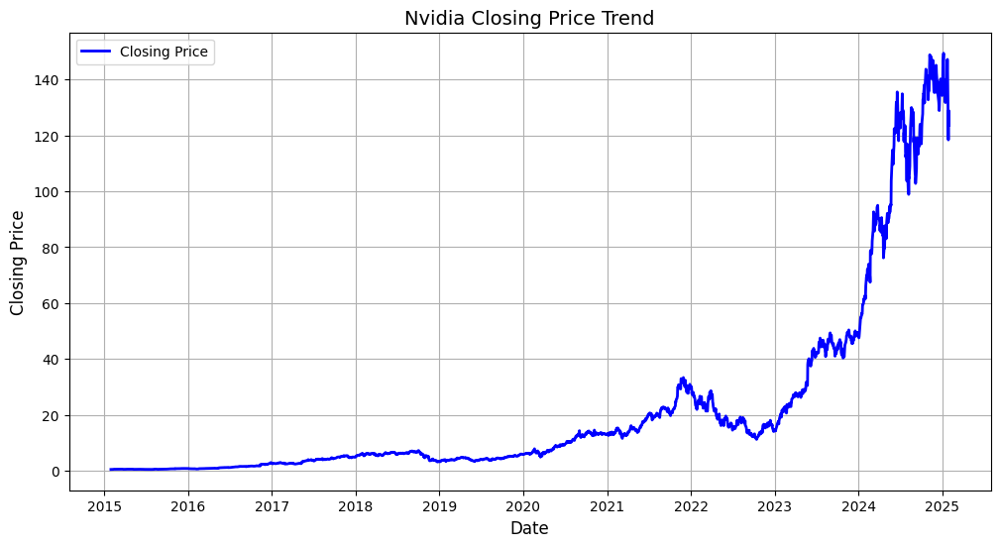

In [99]:
# Closing Price Line Plot
plot_closing_price(df_nvidia, 'Nvidia')

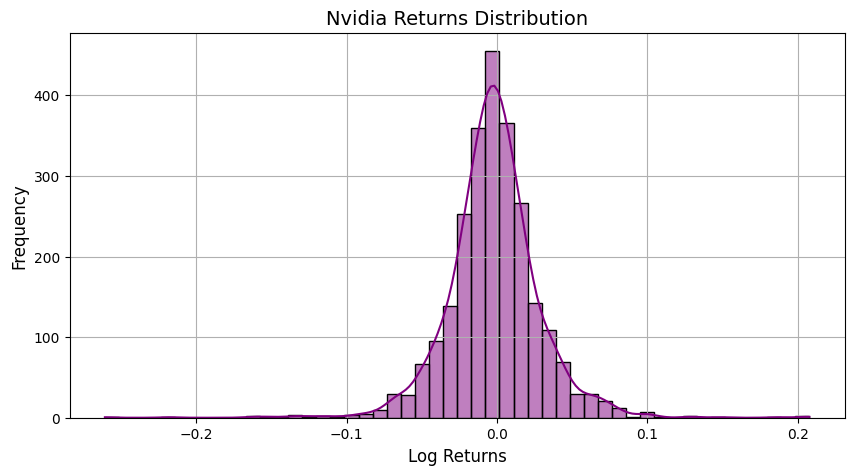

In [100]:
# Log Returns Histogram and KDE Plot
plot_returns_distribution(df_nvidia, 'Nvidia')

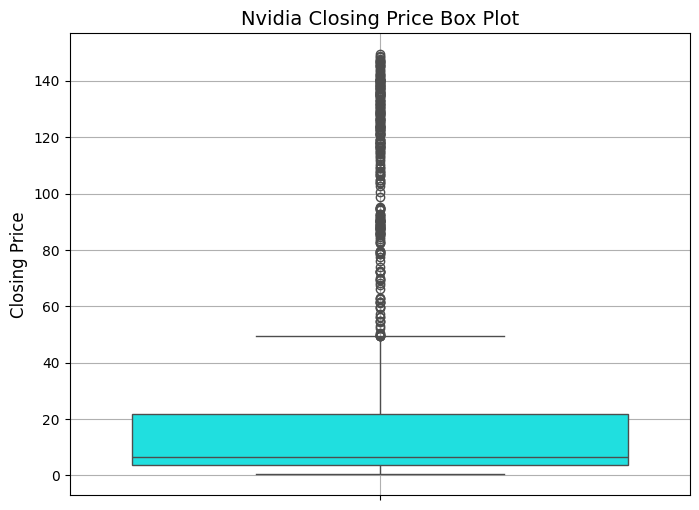

In [101]:
# Box plot of Closing Prices
plot_boxplot_closing(df_nvidia, 'Nvidia')

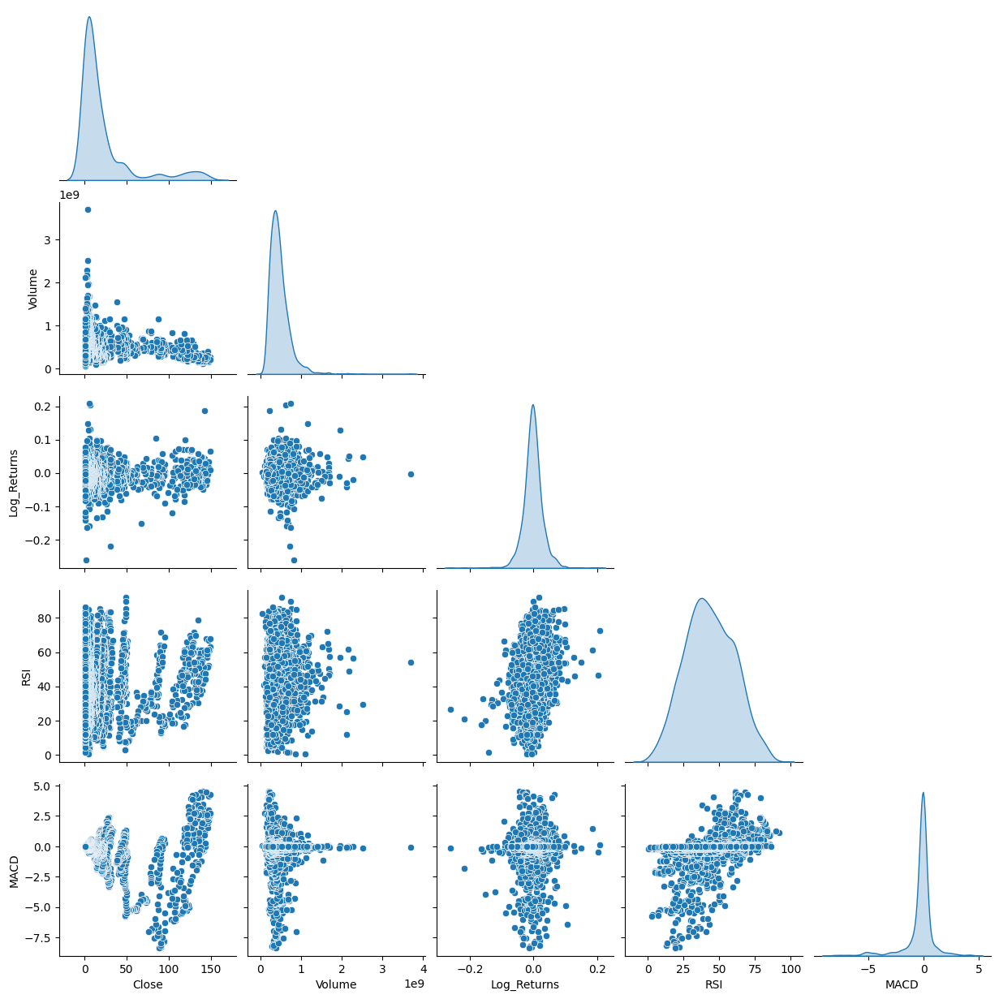

In [102]:
# Pairplot for features relationships
plot_pairplot(df_nvidia)

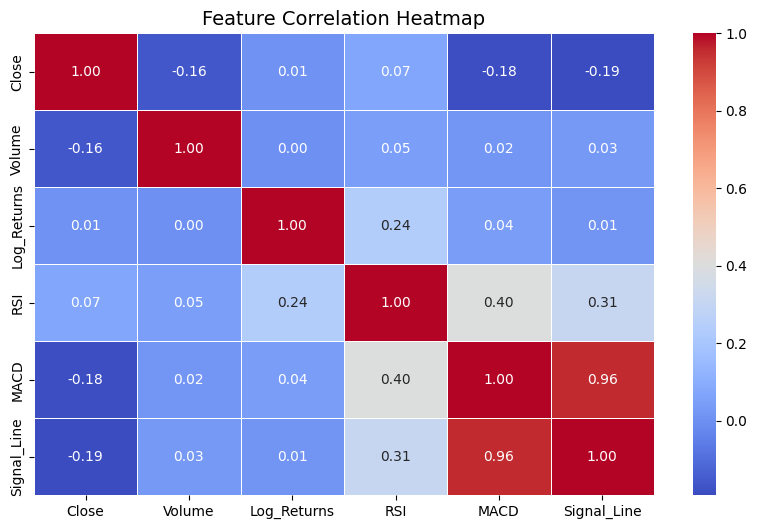

In [103]:
# Correlation Heatmap
plot_correlation_heatmap(df_nvidia)

#### Interactive Visualizations

In [104]:
# Interactive Closing Price
plot_close_price(df_nvidia, 'Nvidia').show()

In [105]:
# Stock Volatility Analysis
plot_volatility_bollinger(df_nvidia, 'Nvidia').show()

In [106]:
# MACD & Signal Line Trend
plot_macd_signal(df_nvidia, 'Nvidia').show()

In [107]:
# RSI Trend
plot_rsi(df_nvidia, 'Nvidia').show()

In [108]:
# Volume Analysis
plot_volume_analysis(df_nvidia, 'Nvidia').show()

#### Combine Static Visualizations for All Stocks

In [4]:
# List of all the datasets
stocks_df = [df_amazon, df_apple, df_google, df_meta, df_micro, df_netflix, df_nvidia]

# List of all the stock names
stock_names = ['Amazon', 'Apple', 'Google', 'Meta', 'Microsoft', 'Netflix', 'Nvidia']

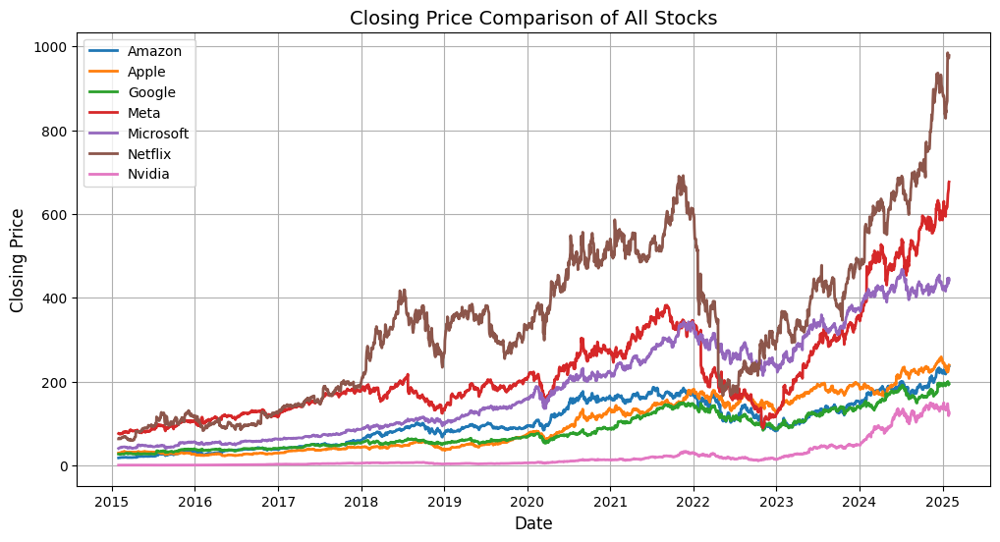

In [118]:
# Closing Price Plot for all stocks
plot_all_stocks_closing_price(stocks_df, stock_names)

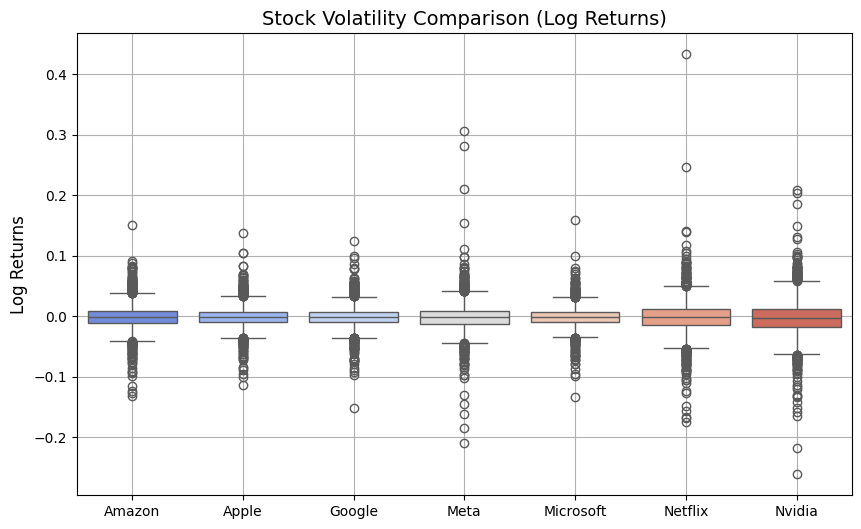

In [119]:
# Stocks Volatility Analysis for all stocks
plot_volatility_boxplot(stocks_df, stock_names)

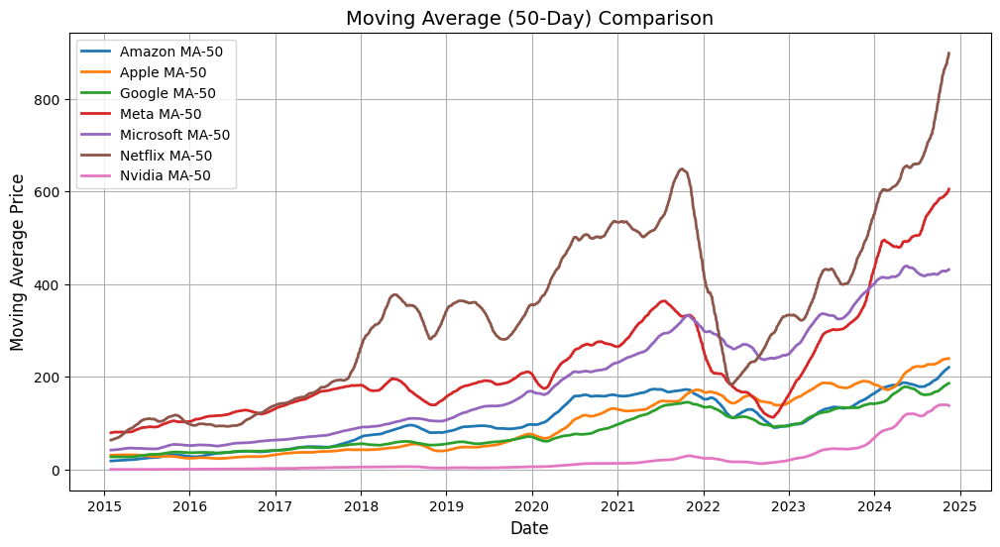

In [120]:
# Rolling Average Comparison for all stocks
plot_rolling_average(stocks_df, stock_names)

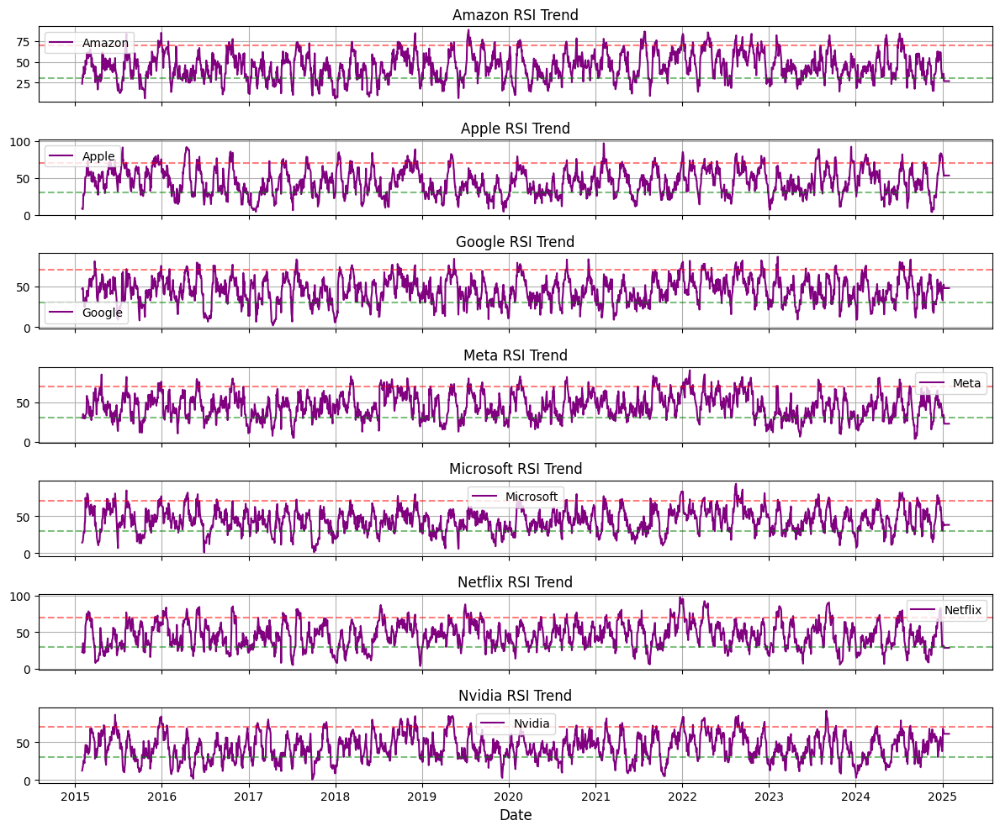

In [121]:
# RSI Trend Across All Stocks
plot_rsi_trends(stocks_df, stock_names)

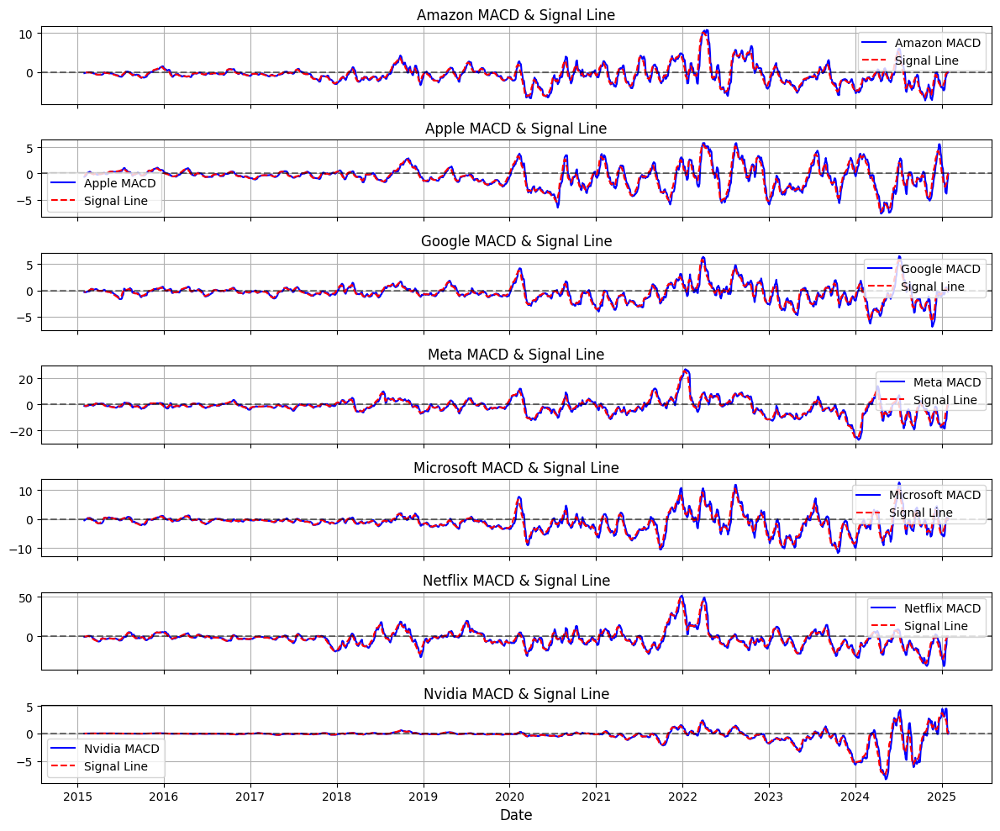

In [122]:
# MACD and Signal Line Trend Across All Stocks
plot_macd_trends(stocks_df, stock_names)

#### Combine Interactive Visualizations for All Stocks

In [126]:
# Stock Price Heatmap
plot_stock_correlation(stocks_df, stock_names)

In [7]:
# Interactive Closing Price Plot
plot_combined_stock_prices(stocks_df, stock_names)

In [5]:
# Stocks volume comparison
plot_combined_volume(stocks_df, stock_names)

In [6]:
# Stocks High Comparison
plot_combined_high(stocks_df, stock_names)

In [7]:
# Stocks Low Comparison
plot_combined_low(stocks_df, stock_names)